# 6 Text and topic analysis

This part of the analysis will focus on analyzing the following text and topic aspects

1. Term frequency development of the top characters in connection to character ends and relationships

2. TF-IDF analysis of the seasons and episodes and visualization with wordclouds

3. Topic analysis - Importance of relationship vs medicine



In [1]:
!pip install wordcloud

import wordcloud
import pandas as pd
import numpy as np
import json
import urllib
from sklearn import preprocessing
import re
import requests
import matplotlib.pyplot as plt
from sklearn import preprocessing
import plotly.express as px
from re import match

import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem import WordNetLemmatizer
from sklearn.decomposition import LatentDirichletAllocation
import string

nltk.download('stopwords')
nltk.download("wordnet")
nltk.download("omw-1.4")
nltk.download('averaged_perceptron_tagger')

%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


## 6.1 Term frequency development of the top characters in connection to character ends and relationships

As we have seen some interesting developments for the main characters degrees and centralities, the text also in connection to the characters ends and relationships will be analyzed further.

In [2]:
# import the characters and filter to Grey's Anatomy
df = pd.read_csv("data/characters.csv")
df_filt = df[df.main_universe == "Grey's Anatomy"].reset_index(drop=True)

# import the season and episode summaries and filter to Grey's Anatomy
f = open("data/episodes.json")
data = json.load(f)
ga_data = list(filter(lambda season: season['show'] == "GA",data))

# import the top Grey's Anatomy characters
f = open("data/top_characters.json")
top_characters = json.load(f)

In [3]:
# create a dataframe with term frequencies for the top characters summed for every seasons
# and for every episode only
characters = []
seasons = []
count_season_new = []
episodes = []
characters_ep = []
count_episodes = []
for character in top_characters:
    e = 0
    for season in range(1, 20):
        character_first = character.split(" ")[0]
        count = ga_data[season-1]['summary_and_plots'].count(character_first)
        for episode in range(1, len(ga_data[season-1]['episodes'])):
            
            count += ga_data[season-1]['episodes'][episode-1]['summary'].count(character_first)

            e += 1
            count_ep = ga_data[season-1]['episodes'][episode-1]['summary'].count(character_first)
            episodes.append(e)
            characters_ep.append(character)
            count_episodes.append(count_ep)

        characters.append(character)
        seasons.append(season)
        count_season_new.append(count)

df_season_counts = pd.DataFrame({"character":characters, "season":seasons, "season_count":count_season_new})
df_episode_counts = pd.DataFrame({"character":characters_ep, "episode":episodes, "episode_count":count_episodes})

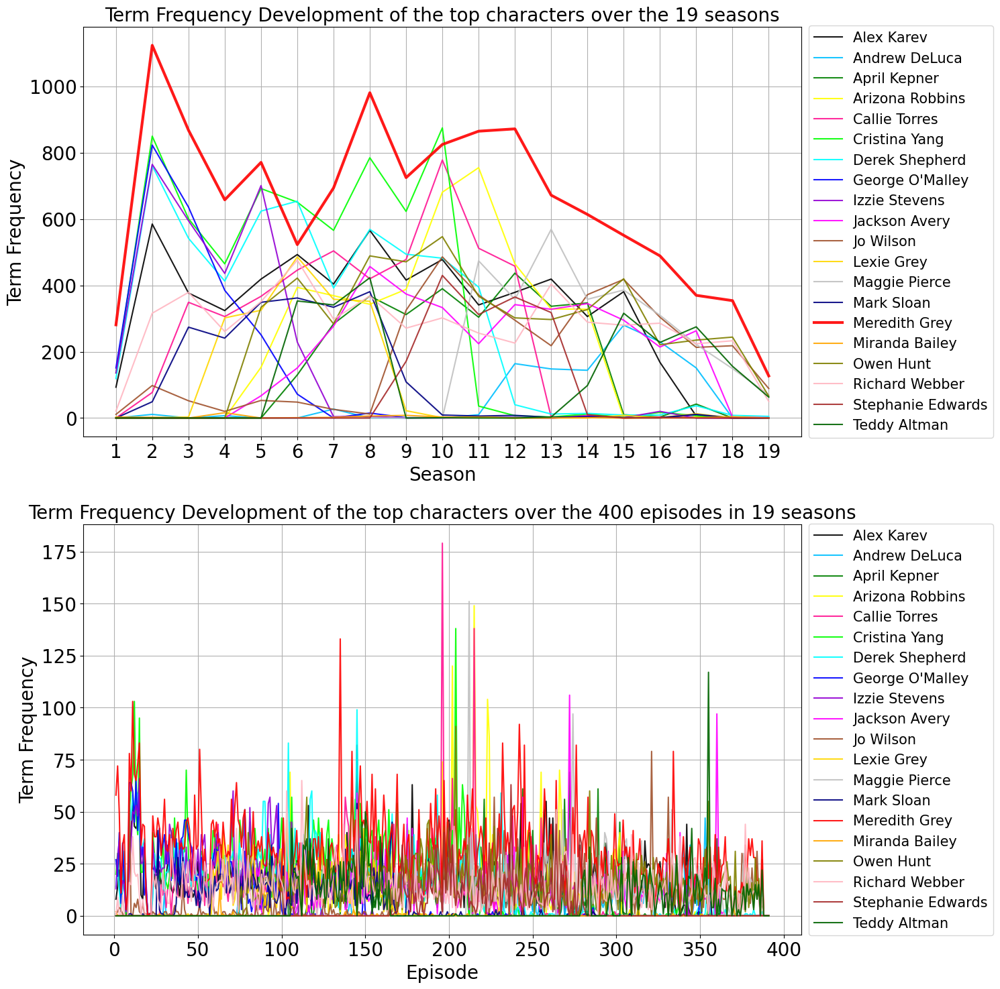

In [4]:
plt.figure(figsize=(15,15))
plt.subplot(2, 1, 1)
plt.title("Term Frequency Development of the top characters over the 19 seasons", fontsize=20)
plt.xlabel("Season", fontsize=20)
plt.ylabel("Term Frequency", fontsize=20)
plt.xticks(range(1, 22), fontsize=20)
plt.yticks(fontsize=20)

colors = ['black', 'deepskyblue', 'green', 'yellow', 'deeppink', 'lime', 'cyan', 'blue', 'darkviolet', 'magenta',
        'sienna', 'gold', 'silver', 'navy', 'red', 'orange', 'olive', 'lightpink', 'brown', 'darkgreen']
j = 0
for character in sorted(top_characters):
    df_char = df_season_counts[df_season_counts.character == character]

    if character == "Meredith Grey":
        plt.plot(df_char.season, df_char.season_count, label = character, color=colors[j], alpha=0.9, linewidth=3)
    else:
        plt.plot(df_char.season, df_char.season_count, label = character, color=colors[j], alpha=0.9)

    j += 1

plt.grid()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15)

plt.subplot(2, 1, 2)
plt.title("Term Frequency Development of the top characters over the 400 episodes in 19 seasons", fontsize=20)
plt.xlabel("Episode", fontsize=20)
plt.ylabel("Term Frequency", fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)

j = 0
for character in sorted(top_characters):
    df_char = df_episode_counts[df_episode_counts.character == character]
    plt.plot(df_char.episode, df_char.episode_count, label = character, color=colors[j], alpha=0.9)
    j += 1

plt.grid()
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15)
plt.tight_layout()

In [5]:
# define the end season of each top character
top_characters_gone = [16, 17, 14, 14, 12, 10, 10, 5, 6, 17, 19, 8, 19, 9, 19, 19, 19, 19, 13, 19]

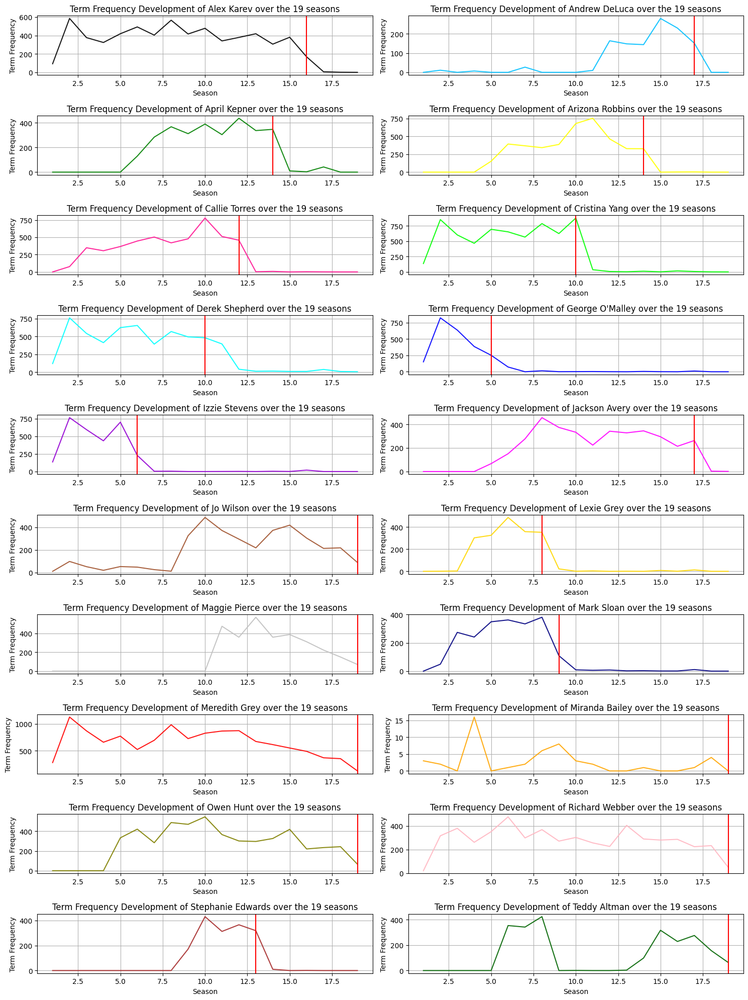

In [6]:
# plot the term development for each character separately with the end
plt.figure(figsize=(15,20))


colors = ['black', 'deepskyblue', 'green', 'yellow', 'deeppink', 'lime', 'cyan', 'blue', 'darkviolet', 'magenta',
        'sienna', 'gold', 'silver', 'navy', 'red', 'orange', 'olive', 'lightpink', 'brown', 'darkgreen']
        
j = 1
for character in sorted(top_characters):
        df_char = df_season_counts[df_season_counts.character == character]
        plt.subplot(10, 2, j)
        plt.plot(df_char.season, df_char.season_count, label = character, color=colors[j-1], alpha=0.9)
        plt.axvline(top_characters_gone[j-1], color="red")
        plt.title("Term Frequency Development of %s over the 19 seasons"%(character))
        plt.xlabel("Season")
        plt.ylabel("Term Frequency")
        plt.grid()
        j += 1

plt.tight_layout()
plt.show()

In [7]:
# create a function for plotting standards
def plot_standards(title):
    plt.title("Term Frequency Development of %s"%(title), fontsize=20)
    plt.xlabel("Season", fontsize=20)
    plt.ylabel("Term Frequency", fontsize=20)
    plt.legend(loc='upper right', fontsize=15)
    plt.xticks(range(1, 20), fontsize=20)
    plt.yticks( fontsize=20)
    plt.grid()

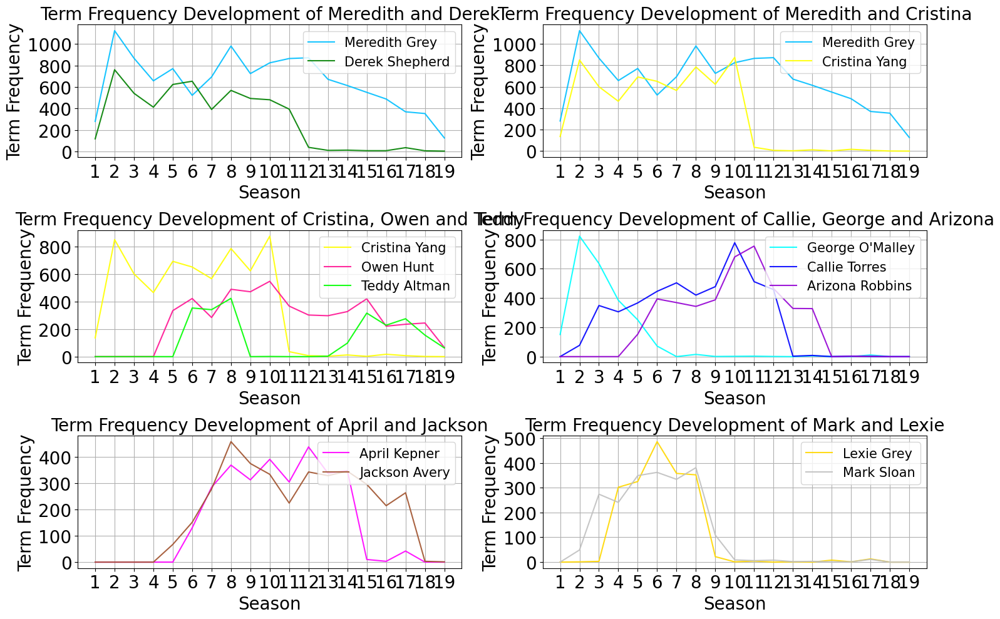

In [8]:
# plot characters with close relationships together
plt.figure(figsize=(15,10))
plt.subplot(3, 2, 1)
plt.plot(df_season_counts[df_season_counts.character == "Meredith Grey"].season, df_season_counts[df_season_counts.character == "Meredith Grey"].season_count, label = "Meredith Grey", color=colors[1], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Derek Shepherd"].season, df_season_counts[df_season_counts.character == "Derek Shepherd"].season_count, label = "Derek Shepherd", color=colors[2], alpha=0.9)
plot_standards("Meredith and Derek")

plt.subplot(3, 2, 2)
plt.plot(df_season_counts[df_season_counts.character == "Meredith Grey"].season, df_season_counts[df_season_counts.character == "Meredith Grey"].season_count, label = "Meredith Grey", color=colors[1], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Cristina Yang"].season, df_season_counts[df_season_counts.character == "Cristina Yang"].season_count, label = "Cristina Yang", color=colors[3], alpha=0.9)
plot_standards("Meredith and Cristina")

plt.subplot(3, 2, 3)
plt.plot(df_season_counts[df_season_counts.character == "Cristina Yang"].season, df_season_counts[df_season_counts.character == "Cristina Yang"].season_count, label = "Cristina Yang", color=colors[3], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Owen Hunt"].season, df_season_counts[df_season_counts.character == "Owen Hunt"].season_count, label = "Owen Hunt", color=colors[4], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Teddy Altman"].season, df_season_counts[df_season_counts.character == "Teddy Altman"].season_count, label = "Teddy Altman", color=colors[5], alpha=0.9)
plot_standards("Cristina, Owen and Teddy")

plt.subplot(3, 2, 4)
plt.plot(df_season_counts[df_season_counts.character == "George O'Malley"].season, df_season_counts[df_season_counts.character == "George O'Malley"].season_count, label = "George O'Malley", color=colors[6], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Callie Torres"].season, df_season_counts[df_season_counts.character == "Callie Torres"].season_count, label = "Callie Torres", color=colors[7], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Arizona Robbins"].season, df_season_counts[df_season_counts.character == "Arizona Robbins"].season_count, label = "Arizona Robbins", color=colors[8], alpha=0.9)
plot_standards("Callie, George and Arizona")

plt.subplot(3, 2, 5)
plt.plot(df_season_counts[df_season_counts.character == "April Kepner"].season, df_season_counts[df_season_counts.character == "April Kepner"].season_count, label = "April Kepner", color=colors[9], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Jackson Avery"].season, df_season_counts[df_season_counts.character == "Jackson Avery"].season_count, label = "Jackson Avery", color=colors[10], alpha=0.9)
plot_standards("April and Jackson")

plt.subplot(3, 2, 6)
plt.plot(df_season_counts[df_season_counts.character == "Lexie Grey"].season, df_season_counts[df_season_counts.character == "Lexie Grey"].season_count, label = "Lexie Grey", color=colors[11], alpha=0.9)
plt.plot(df_season_counts[df_season_counts.character == "Mark Sloan"].season, df_season_counts[df_season_counts.character == "Mark Sloan"].season_count, label = "Mark Sloan", color=colors[12], alpha=0.9)
plot_standards("Mark and Lexie")

plt.tight_layout()
plt.show()

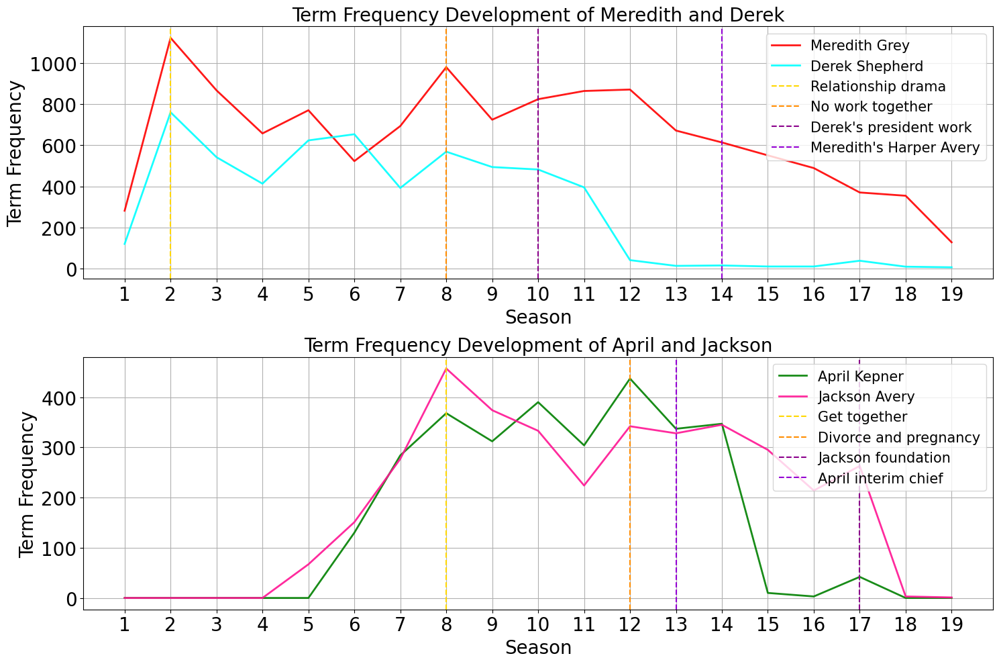

In [9]:
# analyze specific relationships further
plt.figure(figsize=(15,10))
plt.subplot(2, 1, 1)
plt.plot(df_season_counts[df_season_counts.character == "Meredith Grey"].season, df_season_counts[df_season_counts.character == "Meredith Grey"].season_count, label = "Meredith Grey", color="red", alpha=0.9, linewidth=2)
plt.plot(df_season_counts[df_season_counts.character == "Derek Shepherd"].season, df_season_counts[df_season_counts.character == "Derek Shepherd"].season_count, label = "Derek Shepherd", color="cyan", alpha=0.9, linewidth=2)
plt.axvline(2, label="Relationship drama", color="gold", linestyle="--")
plt.axvline(8, label="No work together", color="darkorange", linestyle="--")
plt.axvline(10, label="Derek's president work", color='darkmagenta', linestyle="--")
plt.axvline(14, label="Meredith's Harper Avery", color="darkviolet", linestyle="--")

plot_standards("Meredith and Derek")

plt.subplot(2, 1, 2)
plt.plot(df_season_counts[df_season_counts.character == "April Kepner"].season, df_season_counts[df_season_counts.character == "April Kepner"].season_count, label = "April Kepner", color="green", alpha=0.9, linewidth=2)
plt.plot(df_season_counts[df_season_counts.character == "Jackson Avery"].season, df_season_counts[df_season_counts.character == "Jackson Avery"].season_count, label = "Jackson Avery", color="deeppink", alpha=0.9, linewidth=2)
plt.axvline(8, label="Get together", color="gold", linestyle="--")
plt.axvline(12, label="Divorce and pregnancy", color='darkorange', linestyle="--")
plt.axvline(17, label="Jackson foundation", color="darkmagenta", linestyle="--")
plt.axvline(13, label="April interim chief", color="darkviolet", linestyle="--")
plot_standards("April and Jackson")

plt.tight_layout()
plt.show()

## Main findings of the top characters term frequency analysis

The main findings of the top characters term frequency are that 
* working with the data per seasons rather than single episodes as it is easier and clearer to analyze
* the term frequency development reveals a similar pattern for the couples in the show as they are mentioned together when developing their relationships and they peak at the same seasons
* their main peaks are their main relationship milestones and crises in orange for the examples above and these peaks are higher than the term frequencies for career milestones
* the first plot ("Term frequency development for Meredith and Derek ") above shows that Meredith and Derek have their two main crisis in season 2, in which they separate as Derek tries to save his marriage and then they reconnect, and season 8 where they cannot work together anymore. It is also worth noting that these main peaks were main crises and for example their wedding in season 5 shows a peak but not a major one which fits to the dramatic nature of the show. Compared to this their careers peak less, concretly Derek works for the president of the US in season 10 and Meredith wins the Harper Avery, the main medical award in the show, in season 14 and still this is mentioned less than their relationship drama.
* the second plot shows that similar pattern can be observed for April and Jackson that have an on-off relationship in season 8 and their divorce and pregnancy in season 12

## 6.2 TF-IDF analysis of the seasons and episodes and visualization with wordclouds

To investigate the prevalent topics and themes of the show further, the TF-IDFs were calculated for the seasons using the nltk library. This will be focused on the 18 seasons of Grey's Anatomy as the last seasons does not have a summary of the season yet.

In [10]:
# create a dataframe for the text analysis with the season texts to focus of the overall topics
# of the seasons first
seasons_text = []
for season in range(1, 19):
    text = ga_data[season-1]['summary_and_plots']
    seasons_text.append(text)

df_text = pd.DataFrame({"season": seasons[:18], "text":seasons_text})

In [11]:
# clean the text by removing punctuation, numeric words, lowering the words 
# removing stopwords and names of characters and lemmatizing the words
lemmatizer = WordNetLemmatizer()
stop = stopwords.words('english')

def text_preprocess(text):

    # remove punctuation
    text = "".join([word for word in text if word not in string.punctuation])

    text = "".join([word for word in text if word.isnumeric()==False])

    # lowercase
    text = "".join([word.lower() for word in text])

    # remove stopwords
    text = " ".join([word for word in text.split() if word not in stop
                    and word != "montgomeryshepherd"])

    # leammatizing
    text = " ".join([lemmatizer.lemmatize(word) for word in text.split()])

    return text

df_text['text_clean'] = df_text['text'].apply(text_preprocess)

In [12]:
# create a tf-idf dataframe
stop = nltk.corpus.stopwords.words('english') + ['middle', 'tell', 'take', 'theyre', 'meanwhile', 'make', 'show', 'fact', 'though', 'downright', 'trying', 'long', 'way', 'drawn', 'bag']
tfidf_vectorizer = TfidfVectorizer(stop_words=stop)

tfidf_vector = tfidf_vectorizer.fit_transform(df_text['text_clean'])
tfidf_df = pd.DataFrame(tfidf_vector.toarray(), index=range(1, 19), columns=tfidf_vectorizer.get_feature_names_out())
tfidf_seasons = tfidf_df.transpose()

In [13]:
# define a function to create word clouds from the tf-idf dataframe
def create_wordcloud (data, season, description):
    wordcloud_season = wordcloud.WordCloud(mode='RGBA', background_color='white', width=3000, height=2000, max_words=300).generate_from_frequencies(data[season])
    plt.imshow(wordcloud_season, interpolation="bilinear")
    plt.axis("off")
    plt.title(description, fontsize=20)

KeyboardInterrupt: 

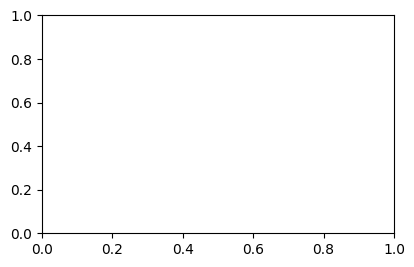

In [35]:
# plot word clouds for season summaries
plt.figure(figsize=[10,30])
j = 0
for i in tfidf_seasons:
    j+=1
    plt.subplot(9, 2, j)
    create_wordcloud(tfidf_seasons, i, "Wordcloud for season: "+str(i))

plt.tight_layout()
plt.show()

In [34]:
# remove the character names for a focus on the topics 
names_list = []
for index, row in df_filt.iterrows():
    full_name = row['title'].lower()
    first_name = row['title'].split(" ")[0].lower()

    names_list.append(full_name)
    names_list.append(first_name)

    split = row['title'].split(" ")
    if "(" not in full_name and len(split)>1:
        last_name = row['title'].split(" ")[1].lower()
        if last_name not in names_list:
            names_list.append(last_name)

tfidf_seasons_filt = tfidf_seasons[~tfidf_seasons.index.isin(names_list)]

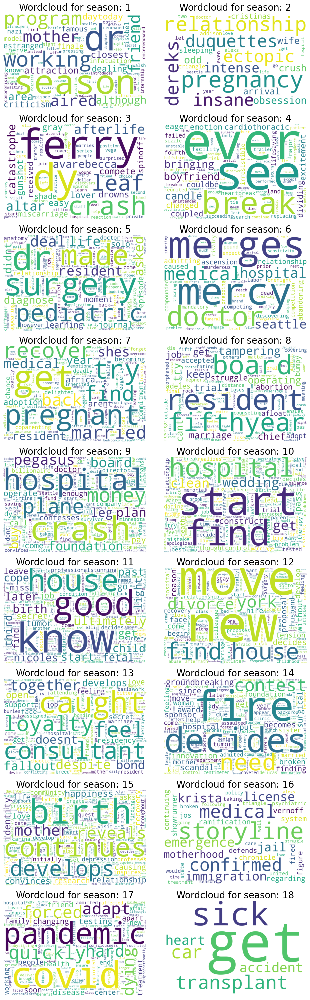

In [16]:
# plot word clouds for season summaries without character names
plt.figure(figsize=[10,30])
j = 0
for i in tfidf_seasons_filt:
    j+=1
    plt.subplot(9, 2, j)
    create_wordcloud(tfidf_seasons_filt, i, "Wordcloud for season: "+str(i))

plt.tight_layout()
plt.show()

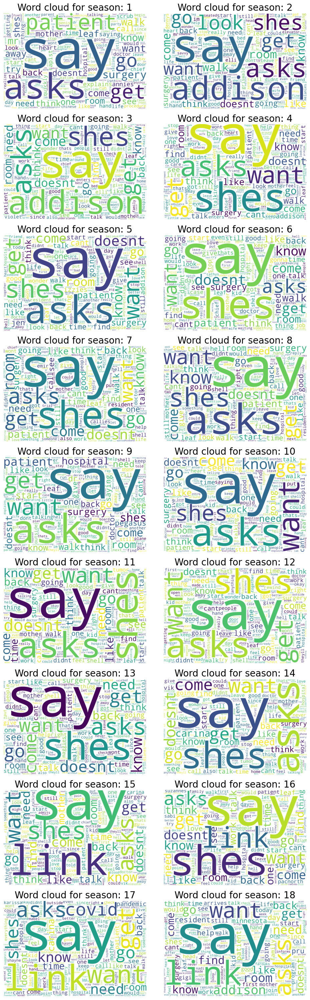

In [17]:
# compare the word clouds to detailed season episode summaries
episodes_text = []
for season in range(1, 19):
    text = ""
    for episode in range(1, len(ga_data[season-1]['episodes'])):
        text += ga_data[season-1]['episodes'][episode-1]['summary']
    
    text_clean = text_preprocess(text)
    episodes_text.append(text_clean)

df_text['text_detail'] = episodes_text

tfidf_vectorizer = TfidfVectorizer(stop_words=stop)
tfidf_vector = tfidf_vectorizer.fit_transform(df_text['text_detail'])
tfidf_df = pd.DataFrame(tfidf_vector.toarray(), index=range(1, 19), columns=tfidf_vectorizer.get_feature_names_out())
tfidf_eps = tfidf_df.transpose()

tfidf_eps_filt = tfidf_eps[~tfidf_eps.index.isin(names_list)]

plt.figure(figsize=[10, 30])
j = 0
for i in tfidf_eps_filt:
        j+=1
        plt.subplot(9, 2, j)
        create_wordcloud(tfidf_eps_filt, i, "Word cloud for season: "+str(i))

plt.tight_layout()
plt.show()

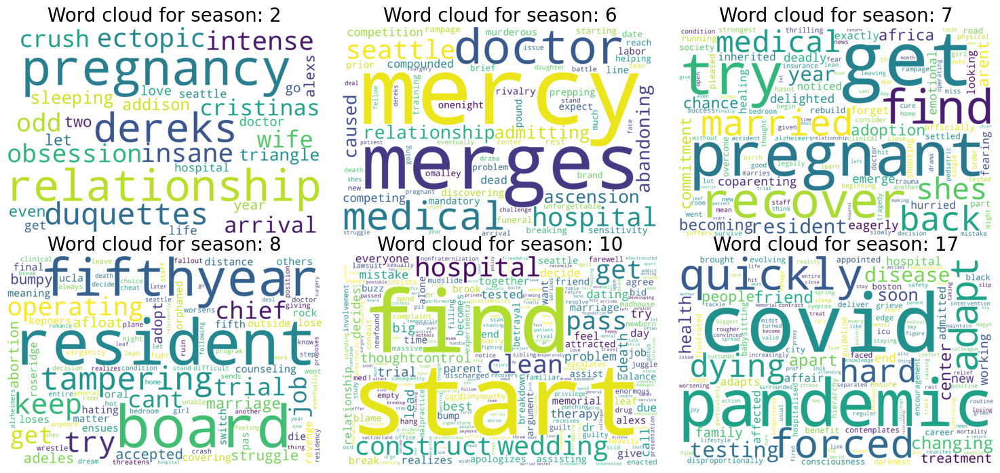

In [18]:
# plot wordclouds for selected seasons
plt.figure(figsize=[15,7])
plt.title("TF-IDF Word clouds for selected Grey's Anatomy seasons", fontsize=20)
j = 0
for i in tfidf_seasons_filt.iloc[:,:-1].head():
    if i in [2, 6, 7, 8, 10, 17]:
        j+=1
        plt.subplot(2, 3, j)
        create_wordcloud(tfidf_seasons_filt, i, "Word cloud for season: "+str(i))

plt.tight_layout()
plt.show()

## Main findings of the TF-IDF analysis of the seasons and episodes

The word clouds of the TF-IDFs show that 
* season summaries are more useful for identifying the main topics as the detailed episode description require a lot of descriptive words such as says, tells, asks which would require a lot more preprocessing compared to the seasons gathering the main ideas
* relationships are important as couples appear together in the wordclouds 
* the main topics of the seasons can be revealed from the TF-IDF calculations and evolve around the medical and personal life
* the word clouds for selected seasons above indicate that there are seasons where personal relationships play a significant role. The wordclouds of season 2, 7 and 10 reveal terms related to personal matters such as "relationship", "pregnancy" or "baby" and show couples in the foreground such as "Callie", "Mark" and "Arizona" in season 7 where they have a baby together or "Christina" and "Shane" who have a romance in season 10
* the other three seasons in the wordcloud plot above evolve more around medical topics. In season 6 Seattle Grace Hospital (the main hospital of the show) merges with another hospital (Mercy West), in season 8 the main residents of the show take their medical board exams and in season 17 the main topic is the covid pandemic explaining more medical terms in the word clouds such as "doctors", "residents", "hospital" or "pandemic"

## 6.3 Topic analysis - Importance of relationship vs medicine

To investigate the topics and importance of relationship vs medicine in the show, topic analysis will be performed and a function to quantify this importance will be created

In [19]:
# prepare the topic columms
for i in range(0, 5):
    topic_name = "Topic_" + str(i)
    df_text[topic_name] = ""
    df_text[topic_name] = df_text[topic_name].astype('object')

In [20]:
# remove the names from the text
def remove_names(text):
    # remove stopwords
    text = str(text)
    text = " ".join([word for word in text.split() if word not in names_list])

    return text

df_text['text_wo_names'] = remove_names(df_text['text_clean'].values)

In [21]:
# for each season text

for index, row in df_text.iterrows():
    # vectorize the text 
    count_vect = CountVectorizer()
    bow_counts = count_vect.fit_transform(df_text[df_text.index == index]['text_wo_names'].values)
    feature_names = count_vect.get_feature_names()

    # train the model with 4 topics this was found through trial and error
    n_topics = 4
    lda = LatentDirichletAllocation(n_components=n_topics, max_iter=5,
                                learning_method='online',
                                learning_offset=50.,
                                random_state=0)
    X_lda_train = lda.fit_transform(bow_counts)
    
    # create a dictionary with the topics and save it to the topic columm
    norm = lda.components_.sum(axis=1)[:, np.newaxis]
    n_top_words = 10
    for topic_idx, topic in enumerate(lda.components_):
        dict_lda = {}
        topic_name = "Topic_" + str(topic_idx)
        for i in topic.argsort()[:-n_top_words - 1:-1]:
            dict_lda[feature_names[i]] = round(topic[i] / norm[topic_idx][0], 3)

        df_text.at[index, topic_name] = dict_lda

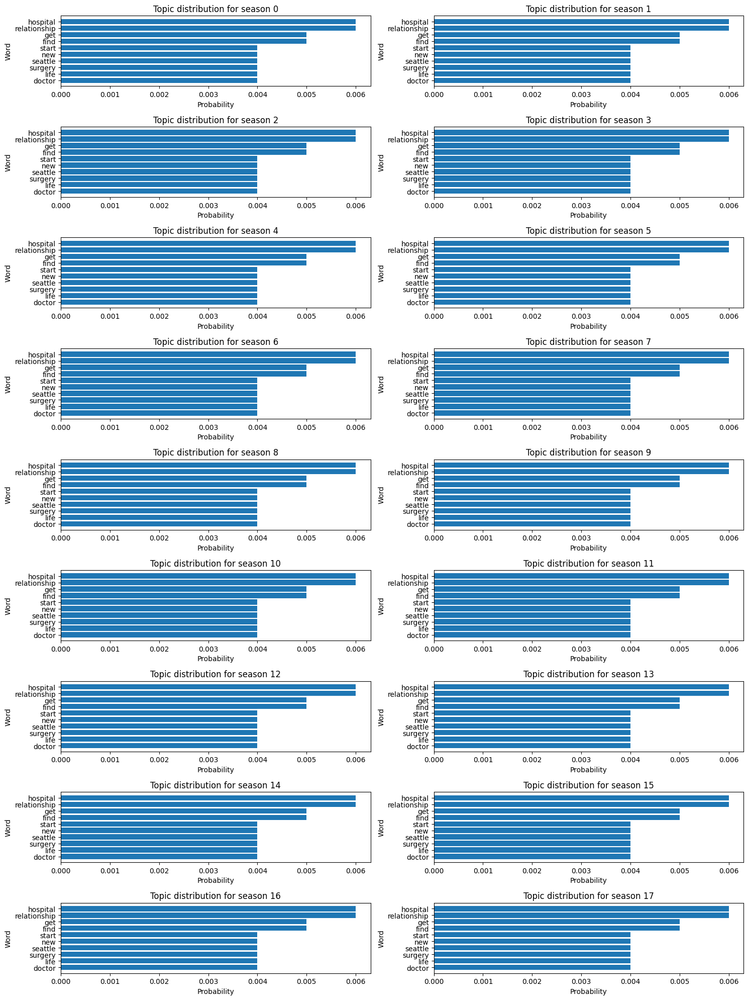

In [22]:
# plot the first topic for each season
plt.figure(figsize=(15, 20))
for index, row in df_text.iterrows():

    plt.subplot(9, 2, index+1)
    plt.title("Topic distribution for season " + str(index))
    plt.xlabel("Probability")
    plt.ylabel("Word")
    words, probs = zip(*row['Topic_0'].items())
    plt.barh(words, probs)
    plt.gca().invert_yaxis()

plt.tight_layout()
plt.show()

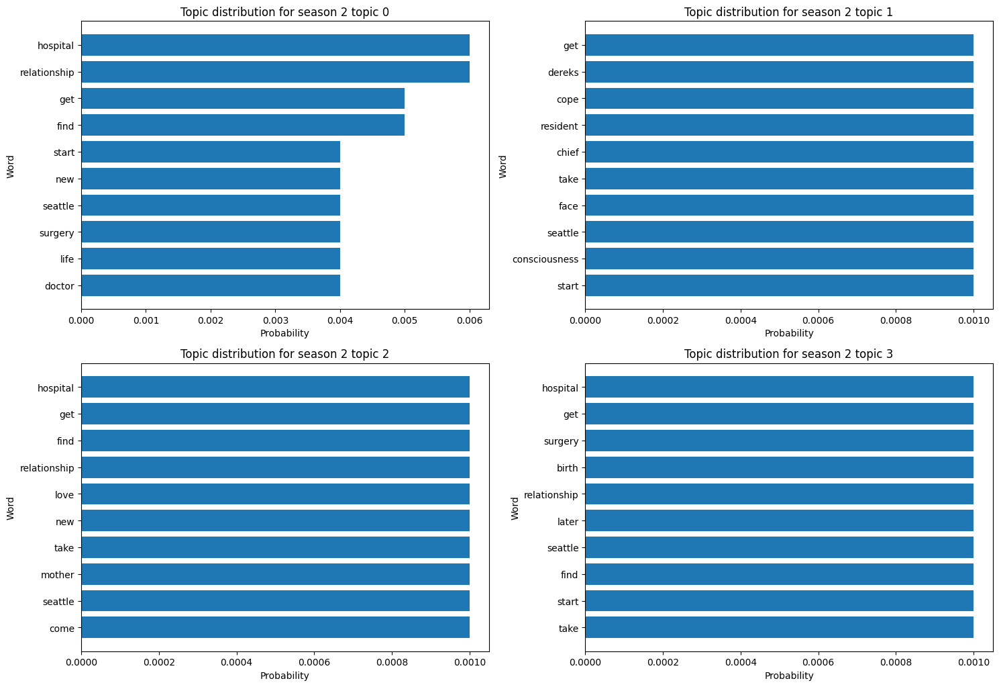

In [23]:
# plot all topics for selected seasons 
plt.figure(figsize=(15, 15))
for index, row in df_text.iterrows():
    if index == 1:
        for topic_idx in range(0, 4):
            topic_name = "Topic_" + str(topic_idx)
            plt.subplot(3, 2, topic_idx+1)
            plt.title("Topic distribution for season 2 topic " + str(topic_idx))
            plt.xlabel("Probability")
            plt.ylabel("Word")
            words, probs = zip(*row[topic_name].items())
            plt.barh(words, probs)
            plt.gca().invert_yaxis()

plt.tight_layout()

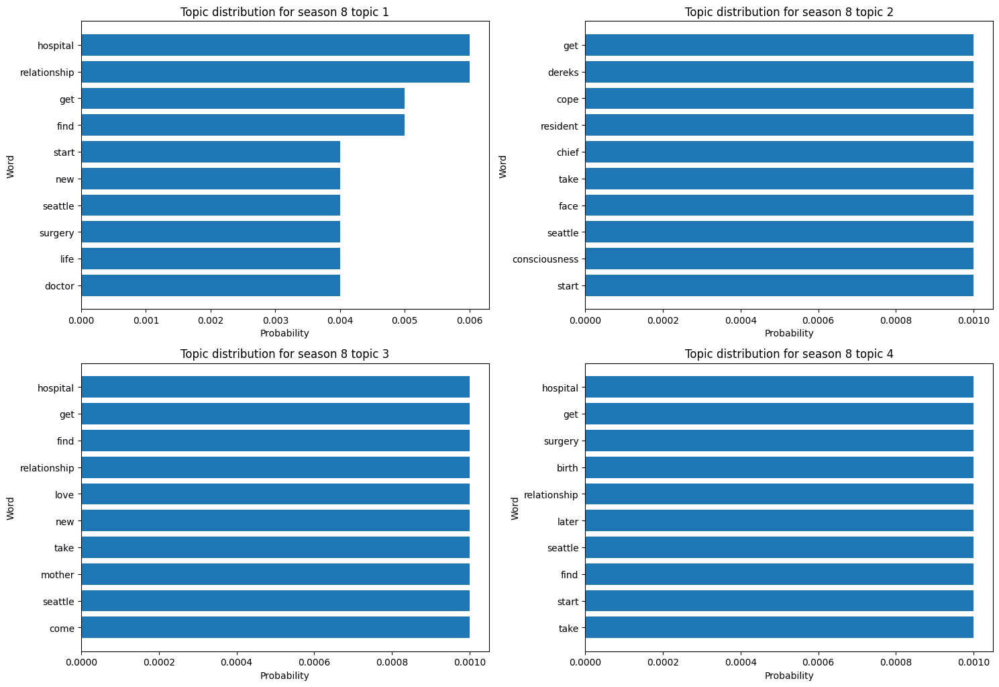

In [24]:
plt.figure(figsize=(15, 15))
for index, row in df_text.iterrows():
    if index == 7:
        for topic_idx in range(0, 4):
            topic_name = "Topic_" + str(topic_idx)
            plt.subplot(3, 2, topic_idx+1)
            plt.title("Topic distribution for season 8 topic " + str(topic_idx+1))
            plt.xlabel("Probability")
            plt.ylabel("Word")
            words, probs = zip(*row[topic_name].items())
            plt.barh(words, probs)
            plt.gca().invert_yaxis()

plt.tight_layout()

In [25]:
# combine all texts in one text
season_all = ""
for index, row in df_text.iterrows():
    text_clean = remove_names(str(row['text_detail']))
    season_all += text_clean

In [26]:
# prepare tokens of the overall season text and get the frequency distribution
nltk.download('punkt')
tokens_clean = nltk.word_tokenize(season_all)

filter_words = ['shes', 'tell', 'asks', 'doesnt', 'talk', 'get', 'walk', 'start', 'look', 'something', 
                'thats', 'call', 'didnt', 'need', 'cant', 'someone', 'addison', 'see', 'everything', 
                'anything', '\'', 'enters', 'try', 'think', 'feel', 'wonder', 'come', 'lot', 'watch', 
                'everyone', 'let', 'say', 'cry', 'dont', 'informs', 'wont', 'sits', 'theyll', 'thing', 
                'want', 'nothing', 'stop', 'week', 'day', 'show', 's', 'meet', 'wants', 'moment', 't', 'minute', 
                'admits', 'know', 'time', 'today', 'move', 'join', 'stay', 'find', 'story', 'end', 'year', 
                'point', 'question', 'hour', 'step', 'whats', 'gon', 'hasnt', 'notice', 'anyone' ]

tokens_red = [token for token in tokens_clean if token not in filter_words]

nouns = [word for (word, pos) in nltk.pos_tag(tokens_red) if pos[:2] == 'NN'] 

freq_dist = nltk.FreqDist(nouns)
freq_dist.most_common(100)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


[('room', 3579),
 ('surgery', 2472),
 ('patient', 1751),
 ('work', 1487),
 ('life', 1437),
 ('hand', 1241),
 ('people', 1216),
 ('hospital', 1147),
 ('mother', 1097),
 ('doctor', 1058),
 ('help', 1052),
 ('leaf', 1051),
 ('shell', 995),
 ('heart', 918),
 ('home', 917),
 ('case', 882),
 ('hell', 863),
 ('kid', 786),
 ('family', 751),
 ('’', 710),
 ('job', 700),
 ('woman', 687),
 ('wife', 687),
 ('parent', 675),
 ('phone', 672),
 ('care', 664),
 ('door', 648),
 ('night', 635),
 ('tumor', 571),
 ('thanks', 564),
 ('place', 551),
 ('blood', 531),
 ('head', 528),
 ('link', 518),
 ('house', 516),
 ('order', 511),
 ('face', 510),
 ('car', 509),
 ('resident', 501),
 ('sex', 489),
 ('check', 486),
 ('board', 486),
 ('husband', 483),
 ('friend', 478),
 ('elevator', 478),
 ('idea', 477),
 ('pain', 447),
 ('problem', 443),
 ('name', 436),
 ('brain', 417),
 ('dr', 414),
 ('love', 402),
 ('plan', 399),
 ('lab', 396),
 ('eye', 392),
 ('chance', 387),
 ('son', 387),
 ('procedure', 386),
 ('part', 378)

In [27]:
# define relationship and medical word lists based on the frequent words
words_med = ['surgery', 'patient', 'work', 'hospital', 'doctor', 'case', 'job', 'tumor', 'blood', 'board',  
            'resident', 'dr', 'procedure', 'lab', 'scrub', 'ambulance', 'office', 'trauma', 'cancer', 'er']

words_rel = ['relationship', 'life', 'mother','home', 'kid', 'family', 'wife', 'parent',  'house','sex',
            'husband', 'friend', 'love', 'son', 'date', 'hate', 'daughter', 'mom']

In [28]:
# calculate a medicine - relationship score for each season
seasons_score = []
for season_text in df_text.text_detail.to_list():
    score = 0
    tokens_clean = nltk.word_tokenize(season_text)
    for token in tokens_clean:
        if token in words_med:
            score -= 1
        elif token in words_rel:
            score += 1
    
    seasons_score.append(score)

In [29]:
# fix the score for each season to a range between 0 and 1
def fix_range(num, inMin = np.min(seasons_score), inMax= np.max(seasons_score),outMin = 0.0,outMax = 1.0):
    return outMin + (float(num - inMin) / float(inMax - inMin) * (outMax - outMin))

seasons_score_range = []
for score in seasons_score:
    new_score = fix_range(score)
    seasons_score_range.append(new_score)

In [30]:
# add the sentiment
# read the sentiment data for a list of words 
df_sentiment = pd.read_csv("word_sentiment_data.txt", sep="\t")

# get english stopwords from the nltk library
stopwords = nltk.corpus.stopwords.words("english")

# function to calculate the sentiment based on the frequency distribution
def sentimentscore(text):
    text_tokenized = nltk.word_tokenize(text)
    fd = nltk.FreqDist([word.lower() for word in text_tokenized if word not in stopwords])
    
    found_words = 0
    score = 0

    for word in fd: 
        if word in df_sentiment.word.to_list():
            found_words += 1 * fd[word]
            hap_score = df_sentiment[df_sentiment.word == word]['happiness_average'].values[0] * fd[word]
            score += hap_score

    if (found_words == 0):
        return -1
    sentiment = score/found_words
    return sentiment

In [31]:
# calculate the sentiment of the summary for each season and fix to a range
summary_sentiment = []
for season in ga_data[:18]:
    season_summary_sentiment = sentimentscore(season['summary_and_plots'])
    summary_sentiment.append(season_summary_sentiment)

def fix_range(num, inMin = np.min(summary_sentiment), inMax= np.max(summary_sentiment),outMin = 0.0,outMax = 1.0):
    return outMin + (float(num - inMin) / float(inMax - inMin) * (outMax - outMin))

summary_sentiment_range = []
for score in summary_sentiment:
    new_score = fix_range(score)
    summary_sentiment_range.append(new_score)

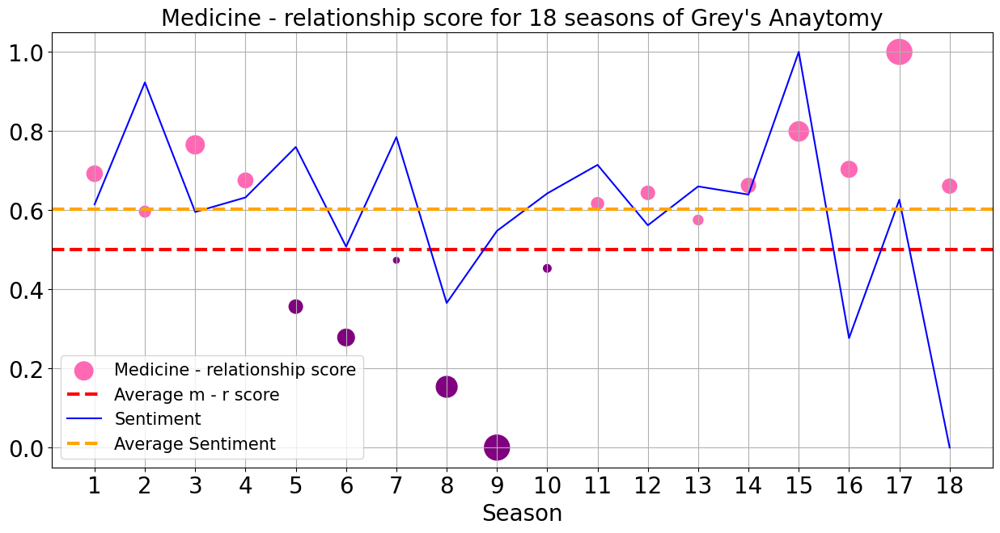

In [32]:
plt.figure(figsize=(15, 7))
plt.title("Medicine - relationship score for 18 seasons of Grey's Anaytomy", fontsize=20)
plt.xlabel("Season", fontsize=20)

colors = ["hotpink" if score >= 0.5 else "purple" for score in seasons_score_range]
size = [abs(0.5 - score)*1000 for score in seasons_score_range]
plt.scatter(range(1, 19), seasons_score_range, s=size, c=colors, label="Medicine - relationship score")
plt.axhline(0.5, color="red", linestyle='--', linewidth=3, label="Average m - r score")
plt.plot(range(1, 19), summary_sentiment_range, label="Sentiment", color="blue")
plt.axhline(np.mean(summary_sentiment_range), color="orange", linestyle='--', linewidth=3, label="Average Sentiment")


plt.xticks(range(1, 19), fontsize=20)
plt.yticks(fontsize=20)
plt.legend(loc='lower left', fontsize=15)
plt.grid()
plt.show()

## Main findings of the topic analysis - Importance of relationship vs medicine

The main findings from the performed analysis are 
* that the topic analysis reveals the main themes of the show and that medicine and relationships are highly intertwined in the show as they show up in the same topics and are not clearly separated
+ relationship related topics prevail compared to medical themes according to the medicine - relationship score
* 13 of 18, are seasons above the threshold of 0.5 in pink indicating that these seasons focus more on relationships than medicine, Only 5 seasons (27.78%) are mostly medical
* some of the more medical seasons were already observed in the word clouds such as 6 or 8 and in season 9, the most medical season, the main characters take over the hospital
* especially season 17, the most relationship based season according to the medicine-relationship score, was expected to be a medical season as it evolves around the Covid pandemic, the fact that is was not identified by the score as a medical season could be explained by the fact that the usual medical expressions were probably not used much as there were not many surgeries or procedures but testing and illness related to the pandemic and these were not fully captured by the usual frequent medical words and Meredith revisited her most important relationships to dead characters in a dream being sick from Covid throughout the season
* the medicine - relationship score gives an indication of the prevailing importance of relationships over medicine in Grey’s Anatomy and gives a plausible result for the seasons, however it is also highly dependent of the chosen words that were used to define the medical and relation based field
* the sentiment curve shows a similar development with a general decrease in sentiment until season 8, increase until season 15 and an up and down from season 16 to 18 which can be seen in the blue curve above (both methods work similarly with lists of words but have different goals)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=6c50234c-0fc5-40eb-b0ef-2d1cda57d893' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>